# Аналитика собранных данных по комментариям

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Выгружаем файлы с комментариями для анализа и объединяем их в один датафрейм 
df1 = pd.read_excel(f"C:/Users/anton/OneDrive/Рабочий стол/Ozon_Parsing/Parsing_folder/Comments_Parsing_1374Part1_Ozon.xlsx", sheet_name='Sheet1')
df2 = pd.read_excel(f"C:/Users/anton/OneDrive/Рабочий стол/Ozon_Parsing/Parsing_folder/Comments_Parsing_32870Part2_Ozon.xlsx", sheet_name='Sheet1')

df = pd.concat([df1, df2])
df

,ID,Достоинства,Недостатки,Комментарий,Дата,Модель,Комментатор,Звезды,link_of_product
0,0,"Приятная ткань, нежный цвет, аккуратно пошито ...",Нет.,"Красивый дизайн, пуговицы при застёгивании не ...","<div class=""z3o"">1 Августа 2023</div>","Цвет товара: светло-синий, Российский размер: ...",\n Наталья В.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
1,1,"Ткань очень приятная к телу, ложится по фигуре...",Нет,NaN,"<div class=""z3o"">1 Августа 2023</div>","Цвет товара: светло-серый, Российский размер: ...",\n Оксана М.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
2,2,Качество,Не выявлены,Подойдет для мужчин с небольшим животиком. На ...,"<div class=""z3o"">1 Августа 2023</div>","Цвет товара: зеленый-голубой, Российский разме...",\n Олег Ч.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
3,3,"хороший,мягкий материал",маломерит,NaN,"<div class=""z3o"">1 Августа 2023</div>","Цвет товара: светло-синий, Российский размер: ...",\n Гульнара Ш.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
4,4,NaN,NaN,NaN,"<div class=""z3o"">1 Августа 2023</div>","Цвет товара: светло-синий, Российский размер: ...",\n Александр И.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
...,...,...,...,...,...,...,...,...,...
19122,32866,NaN,NaN,NaN,"<div class=""z3o"">27 Ноября 2021</div>","Российский размер: 54, Размер производителя: XXL",\n Михаил Ч.\n,5,https://www.ozon.ru/product/futbolka-mother-ru...
19123,32867,NaN,NaN,NaN,"<div class=""z3o"">3 Марта 2022</div>","Российский размер: 50, Размер производителя: L",\n Роза А.\n,5,https://www.ozon.ru/product/futbolka-mother-ru...
19124,32868,NaN,NaN,NaN,"<div class=""z3o"">20 Января 2022</div>","Российский размер: 50, Размер производителя: L",\n Анна Г.\n,5,https://www.ozon.ru/product/futbolka-mother-ru...
19125,32869,"Крутая футболка, принт хорошего качества, боль...",Нет,👍🏼,"<div class=""z3o"">31 Июля 2023</div>",NaN,\n Пользователь предпочёл скрыть свои д...,5,https://www.ozon.ru/product/futbolka-not-today...


## Отчистим данные и подготовим их для анализа

In [3]:
# почистим дату 
df1 = df.copy()
date_list = list(df1.copy()['Дата'])

date_list_new =[]
for i in range(len(date_list)):
    date_i = date_list[i]
    new_date_i = date_i[17:-6]
    new_date_ii = new_date_i.translate({ord(j): ' ' for j in '\xa0'})
    date_list_new.append(new_date_ii)

date_list_new
df1['Дата'] = date_list_new
df1

,ID,Достоинства,Недостатки,Комментарий,Дата,Модель,Комментатор,Звезды,link_of_product
0,0,"Приятная ткань, нежный цвет, аккуратно пошито ...",Нет.,"Красивый дизайн, пуговицы при застёгивании не ...",1 Августа 2023,"Цвет товара: светло-синий, Российский размер: ...",\n Наталья В.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
1,1,"Ткань очень приятная к телу, ложится по фигуре...",Нет,NaN,1 Августа 2023,"Цвет товара: светло-серый, Российский размер: ...",\n Оксана М.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
2,2,Качество,Не выявлены,Подойдет для мужчин с небольшим животиком. На ...,1 Августа 2023,"Цвет товара: зеленый-голубой, Российский разме...",\n Олег Ч.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
3,3,"хороший,мягкий материал",маломерит,NaN,1 Августа 2023,"Цвет товара: светло-синий, Российский размер: ...",\n Гульнара Ш.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
4,4,NaN,NaN,NaN,1 Августа 2023,"Цвет товара: светло-синий, Российский размер: ...",\n Александр И.\n,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
...,...,...,...,...,...,...,...,...,...
19122,32866,NaN,NaN,NaN,27 Ноября 2021,"Российский размер: 54, Размер производителя: XXL",\n Михаил Ч.\n,5,https://www.ozon.ru/product/futbolka-mother-ru...
19123,32867,NaN,NaN,NaN,3 Марта 2022,"Российский размер: 50, Размер производителя: L",\n Роза А.\n,5,https://www.ozon.ru/product/futbolka-mother-ru...
19124,32868,NaN,NaN,NaN,20 Января 2022,"Российский размер: 50, Размер производителя: L",\n Анна Г.\n,5,https://www.ozon.ru/product/futbolka-mother-ru...
19125,32869,"Крутая футболка, принт хорошего качества, боль...",Нет,👍🏼,31 Июля 2023,NaN,\n Пользователь предпочёл скрыть свои д...,5,https://www.ozon.ru/product/futbolka-not-today...


In [4]:
# почистим имя комментатора
name_list = list(df['Комментатор'])

new_name_list = []
for i in range(len(name_list)):
    name_i = name_list[i]
    new_name_i = name_i[9:-7]
    new_name_i = new_name_i.translate({ord(j): '' for j in '\n'})
    new_name_list.append(new_name_i)

new_name_list 
df1['Комментатор'] = new_name_list
df1

,ID,Достоинства,Недостатки,Комментарий,Дата,Модель,Комментатор,Звезды,link_of_product
0,0,"Приятная ткань, нежный цвет, аккуратно пошито ...",Нет.,"Красивый дизайн, пуговицы при застёгивании не ...",1 Августа 2023,"Цвет товара: светло-синий, Российский размер: ...",Наталья В.,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
1,1,"Ткань очень приятная к телу, ложится по фигуре...",Нет,NaN,1 Августа 2023,"Цвет товара: светло-серый, Российский размер: ...",Оксана М.,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
2,2,Качество,Не выявлены,Подойдет для мужчин с небольшим животиком. На ...,1 Августа 2023,"Цвет товара: зеленый-голубой, Российский разме...",Олег Ч.,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
3,3,"хороший,мягкий материал",маломерит,NaN,1 Августа 2023,"Цвет товара: светло-синий, Российский размер: ...",Гульнара Ш.,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
4,4,NaN,NaN,NaN,1 Августа 2023,"Цвет товара: светло-синий, Российский размер: ...",Александр И.,5,https://www.ozon.ru/product/polo-jaffa-1-sht-9...
...,...,...,...,...,...,...,...,...,...
19122,32866,NaN,NaN,NaN,27 Ноября 2021,"Российский размер: 54, Размер производителя: XXL",Михаил Ч.,5,https://www.ozon.ru/product/futbolka-mother-ru...
19123,32867,NaN,NaN,NaN,3 Марта 2022,"Российский размер: 50, Размер производителя: L",Роза А.,5,https://www.ozon.ru/product/futbolka-mother-ru...
19124,32868,NaN,NaN,NaN,20 Января 2022,"Российский размер: 50, Размер производителя: L",Анна Г.,5,https://www.ozon.ru/product/futbolka-mother-ru...
19125,32869,"Крутая футболка, принт хорошего качества, боль...",Нет,👍🏼,31 Июля 2023,NaN,Пользователь предпочёл скрыть свои данные,5,https://www.ozon.ru/product/futbolka-not-today...


## Сравним колчиество комментариев по звездам 

In [5]:
stars = df1['Звезды'].value_counts()
stars_1 = df1['Звезды'].value_counts(1)
stars = dict(stars)
print(stars)
stars_1 = dict(stars)[1]
stars_2 = dict(stars)[2]
stars_3 = dict(stars)[3]
stars_4 = dict(stars)[4]
stars_5 = dict(stars)[5]
#stars_1, stars_2, stars_3, stars_4, stars_5

stars_percent0 = df1['Звезды'].value_counts(1)

stars_percent = dict(map(lambda x: (x[0], round(x[1]*100,2)), stars_percent0.items()))
print(stars_percent)

{5: 27902, 4: 2743, 3: 1188, 1: 614, 2: 424}
{5: 84.88, 4: 8.34, 3: 3.61, 1: 1.87, 2: 1.29}


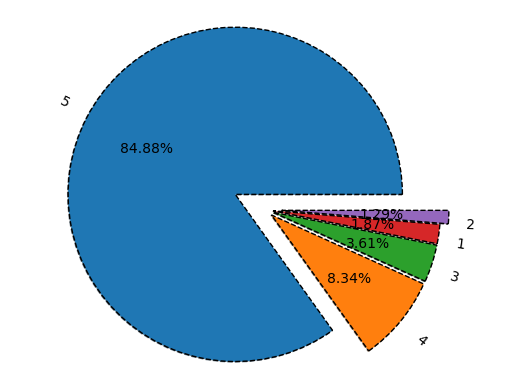

In [39]:
explode = (2, 0.5, 0.5, 0.5, 1)
fig, ax = plt.subplots()
ax.pie(stars.values(), labels = stars.keys(), radius = 10, autopct ='%1.2f%%', shadow=True,
       explode=explode, wedgeprops={'lw':1, 'ls':'--','edgecolor':"k"}, 
       rotatelabels=True)
ax.axis("equal")
plt.savefig('saved_figure.png', transparent=True)

Как можно заметить, большую часть отзывов в категории "футболки" оставлять с оценкой 5. Получается, что в большинстве своем потребители остаются довольны покупками.

84,88% - отзывов на 5 звезд 

8,34% - отзывов на 4 звезды 

3,61% - отзывов на 3 звезды

1,87% - отзывов на 1 звезду

1,29% отзывов на 2 звезды 

## Сравним соотношение отзывов без комментариев 

In [7]:
# отчистим датафрейм от "немых отзывов" (отзывы без комментариев/Достоинтсв/Недостатков)
df_out_of_NaN = df1.copy().dropna(thresh= 7) 

In [8]:
stars_n = dict(df_out_of_NaN['Звезды'].value_counts())
stars_n

{5: 13614, 4: 1446, 3: 992, 1: 544, 2: 367}

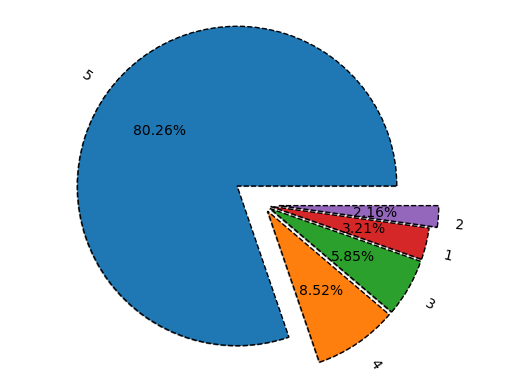

In [41]:
explode = (2, 0.5, 0.5, 0.5, 1)
fig, ax = plt.subplots()
ax.pie(stars_n.values(), labels = stars_n.keys(), radius = 10, autopct ='%1.2f%%', shadow=True,
       explode=explode, wedgeprops={'lw':1, 'ls':'--','edgecolor':"k"}, 
       rotatelabels=True)
ax.axis("equal")
plt.savefig('saved1.png', transparent=True)

При рассмотрении НЕпустых отзывов ситуация осталась прежней 

In [9]:
# рассчитаем соотношение пустых отзывов к отзывам с комментариями 
d_ratio = {}
for i in range(1,6):
    ratio = round(stars_n[i]/stars[i] *100,2)
    d_ratio.update({i: ratio})
    
import operator
from collections import OrderedDict
sorted(d_ratio.items(), key=operator.itemgetter(1))
d_ratio

{1: 88.6, 2: 86.56, 3: 83.5, 4: 52.72, 5: 48.79}

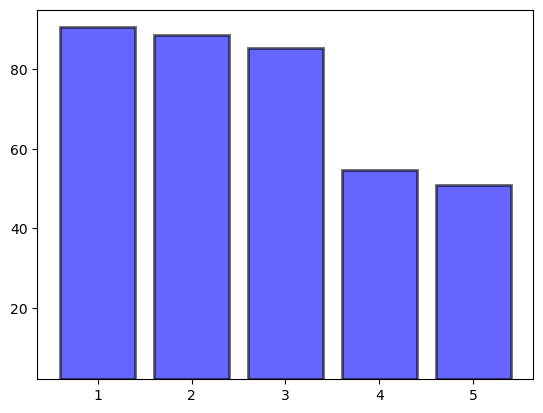

In [42]:
import matplotlib.colors as mcolors
bc = mcolors.BASE_COLORS


groups = d_ratio.keys()
counts = d_ratio.values()

plt.bar(groups, counts, alpha=0.6, bottom=2, color='blue', edgecolor="k", linewidth=2)
plt.savefig('saved2.png', transparent=True)

Можем проследить закономерность: чем меньше звезд, тем люди чаще оставляют комментарии.

Процент написанных комментариев в отзывах: 
88,6% - у отзывов на 1 звезду

86,56% - у отзывов на 2 звезды

83,5% - у отзывов на 3 звезды

52,72% - у отзывов на 4 звезды

48,79% - отзывов на 5 звезды

## Определение самых часто встречающихся слов в комментариях

### Отзывы на 1 звезду 
В первом примере пропишем функции для анализа текста

In [11]:
# модуль для анализа текста
! pip install nltk

In [12]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')

import math
import string

from nltk import word_tokenize
from nltk.probability import FreqDist

from nltk.corpus import stopwords

[nltk_data] Error loading punkt: <urlopen error [WinError 10060]
[nltk_data]     Попытка установить соединение была безуспешной, т.к.
[nltk_data]     от другого компьютера за требуемое время не получен
[nltk_data]     нужный отклик, или было разорвано уже установленное
[nltk_data]     соединение из-за неверного отклика уже подключенного
[nltk_data]     компьютера>
[nltk_data] Error loading wordnet: <urlopen error [WinError 10060]
[nltk_data]     Попытка установить соединение была безуспешной, т.к.
[nltk_data]     от другого компьютера за требуемое время не получен
[nltk_data]     нужный отклик, или было разорвано уже установленное
[nltk_data]     соединение из-за неверного отклика уже подключенного
[nltk_data]     компьютера>
[nltk_data] Error loading omw-1.4: <urlopen error [WinError 10060]
[nltk_data]     Попытка установить соединение была безуспешной, т.к.
[nltk_data]     от другого компьютера за требуемое время не получен
[nltk_data]     нужный отклик, или было разорвано уже устано

In [16]:
# Создадим массив с нужными комментариями
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 1]
dost_1 = [item for item in list(frame_1['Достоинства']) if str(item) != 'nan']
dost_1

['Хороший дизайн\xa0',
 'Качество хорошее \xa0',
 'материал как пласмасса\xa0',
 'нет\xa0',
 'скорость доставки есть одно достоинство. \xa0',
 'нет\xa0',
 'хороший фасон\xa0',
 'материал как пласмасса\xa0',
 'нет\xa0',
 'скорость доставки есть одно достоинство. \xa0',
 'нет\xa0',
 ' нет\xa0',
 'нет\xa0',
 'Не очень \xa0',
 'качество ткани хорошее, швы ровные и аккуратные\xa0',
 'Не соответствует описанию \xa0',
 'хороший фасон\xa0',
 'хороший фасон\xa0',
 'Нет\xa0',
 'Не тот цвет прислали вообще и маломерки на размера 2\xa0',
 'Нет\xa0',
 'нет\xa0',
 'нет их.\xa0',
 'Нет\xa0',
 'Нету\xa0',
 'Цена\xa0',
 'цена\xa0',
 'просто футболка\xa0',
 'Хорошая футболка \xa0',
 'нет\xa0',
 'нет\xa0',
 'Нет\xa0',
 'просто футболка\xa0',
 'нет\n\xa0',
 'достоинства нет\xa0',
 'нету\xa0',
 'Нет\xa0',
 'хорошая футболка\xa0',
 'нет\xa0',
 'Нет\xa0',
 'Нет\xa0',
 'нет\xa0',
 'нет\xa0',
 'удобная, свободная \xa0',
 'Нет\xa0',
 'Довольно качественно, но это не оригинал \xa0',
 'РЕПЛИКА, но не самого плохо

In [17]:
# Функция для анализа массива текста 
def comment_analysis(massive_of_text):
    # делаем весь массив одной сторокой
    text = str(massive_of_text)
    # переводим все буквы в нижний регистр
    text = text.lower()
    # убираем знаки пунктуации и разделители 
    string.punctuation
    spec_chars = string.punctuation + 'xa0' #добавили нужный нам разделитель для исключение из общего текста 
    text = "".join([ch for ch in text if ch not in spec_chars])
    
    # токенизируем текст
    text_tokens = word_tokenize(text)
    # переводим токены в текстовый формат
    text = nltk.Text(text_tokens)
    #считаем слова в тексте по популярности
    fdist = FreqDist(text)
    # выводим первые N популярных слов
    #fdist.most_common(5)
    
    #Чистим текст от стоп-слов, добавляем русские стоп-слова
    russian_stopwords = stopwords.words("russian")
    # перестраиваем токены, не учитывая стоп-слова
    text_tokens = [token.strip() for token in text_tokens if token not in russian_stopwords]
    # снова приводим токены к текстовому виду
    text = nltk.Text(text_tokens)
    # считаем заново частоту слов
    fdist_sw = FreqDist(text)
    # показываем самые популярные слова 
    most_popular_words = fdist_sw.most_common(20)
    
    return text, most_popular_words 


In [18]:
comment_analysis(dost_1)

(<Text: хороший дизайн качество хорошее материал пласмасса скорость доставки...>,
 [('футболка', 28),
  ('качество', 16),
  ('хорошее', 15),
  ('хорошая', 12),
  ('хороший', 11),
  ('нету', 10),
  ('цена', 10),
  ('фасон', 7),
  ('материал', 6),
  ('просто', 6),
  ('хлопок', 6),
  ('довольно', 5),
  ('качественно', 5),
  ('это', 5),
  ('оригинал', 5),
  ('реплика', 5),
  ('самого', 5),
  ('плохого', 5),
  ('качества', 5),
  ('неплохая', 5)])

In [19]:
# модуль для облака слов
! pip install wordcloud

In [20]:
# подключаем библиотеку для создания облака слов
from wordcloud import WordCloud
# и графический модуль, с помощью которого нарисуем это облако
import matplotlib.pyplot as plt

In [21]:
def word_cloud(text):
#Создаем облако слов
    # переводим всё в текстовый формат
    text_raw = " ".join(text)
    # готовим размер картинки
    wordcloud = WordCloud(width=1600, height=800).generate(text_raw)
    plt.figure( figsize=(20,10), facecolor='k')
    # добавляем туда облако слов
    plt.imshow(wordcloud)
    # выключаем оси и подписи
    plt.axis("off")
    # убираем рамку вокруг
    plt.tight_layout(pad=0)
    # выводим картинку на экран
    
    return plt.show()

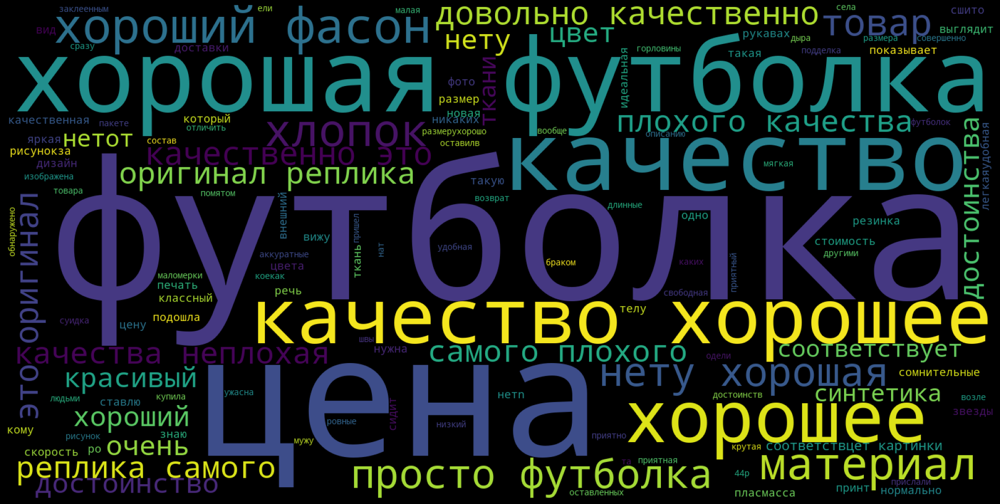

<Figure size 640x480 with 0 Axes>

In [43]:
word_cloud(comment_analysis(dost_1)[0])
plt.savefig('saved3.png', transparent=True)

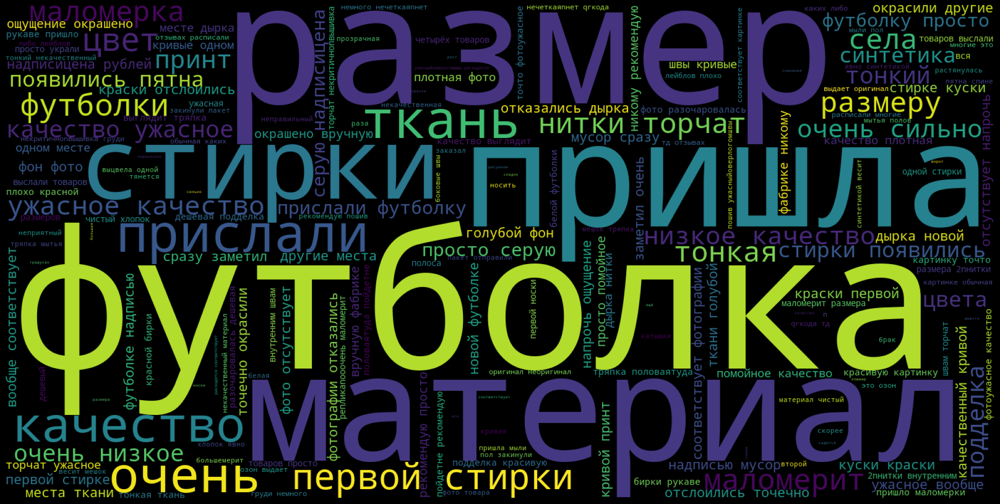

((<Text: неправильный размер соответствует заявленному размеру ворот растянулся первой...>,
  [('качество', 64),
   ('стирки', 45),
   ('очень', 38),
   ('футболка', 34),
   ('материал', 30),
   ('размер', 27),
   ('первой', 26),
   ('просто', 26),
   ('прислали', 25),
   ('ткань', 25),
   ('соответствует', 24),
   ('пришла', 24),
   ('фото', 23),
   ('торчат', 21),
   ('маломерит', 20),
   ('подделка', 19),
   ('дырка', 17),
   ('нитки', 17),
   ('рекомендую', 17),
   ('футболки', 17)]),
 None)

In [23]:
# Недостатки 1 звезда 
nedost_1 = [item for item in list(frame_1['Недостатки']) if str(item) != 'nan']
comment_analysis(nedost_1), word_cloud(comment_analysis(nedost_1)[0])

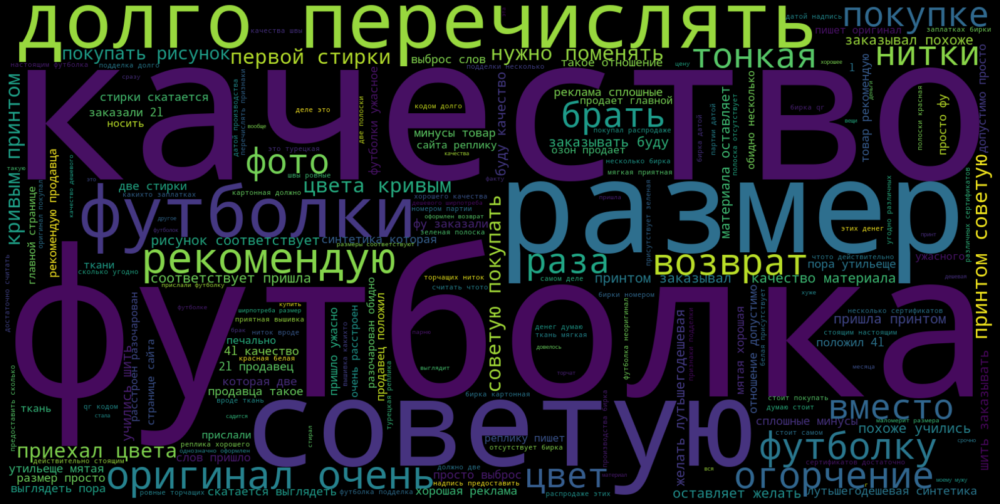

((<Text: заказывала парню сверяла размером футболки эта пришла 2...>,
  [('качество', 39),
   ('футболка', 32),
   ('размер', 25),
   ('советую', 25),
   ('просто', 20),
   ('рекомендую', 20),
   ('стирки', 18),
   ('стоит', 17),
   ('пришла', 16),
   ('оригинал', 16),
   ('футболки', 15),
   ('покупать', 15),
   ('ткань', 15),
   ('бирка', 15),
   ('возврат', 14),
   ('принтом', 14),
   ('это', 13),
   ('качества', 13),
   ('цвета', 13),
   ('продавца', 12)]),
 None)

In [256]:
# Комментарий 1 звезда
comm_1 = [item for item in list(frame_1['Комментарий']) if str(item) != 'nan']
comment_analysis(comm_1), word_cloud(comment_analysis(comm_1)[0])

## Результаты анализа  отзывов на 1 звезду

### 88,6% отзывов на 1 звезду являются не пустыми 

### При указании недостатков чаще всего встречаются слова  
-- [('качество', 64),
   ('стирки', 45),
   ('очень', 38),
   ('футболка', 34),
   ('материал', 30),
   ('размер', 27),
   ('первой', 26),
   ('просто', 26),
   ('прислали', 25),
   ('ткань', 25),
   ('соответствует', 24),
   ('пришла', 24),
   ('фото', 23),
   ('торчат', 21),
   ('маломерит', 20),
   ('подделка', 19),
   ('дырка', 17),
   ('нитки', 17),
   ('рекомендую', 17),
   ('футболки', 17)])
   
 ### При написании комментариев чаще всего встречаются слова -- 
 [('качество', 39),
   ('футболка', 32),
   ('размер', 25),
   ('советую', 25),
   ('просто', 20),
   ('рекомендую', 20),
   ('стирки', 18),
   ('стоит', 17),
   ('пришла', 16),
   ('оригинал', 16),
   ('футболки', 15),
   ('покупать', 15),
   ('ткань', 15),
   ('бирка', 15),
   ('возврат', 14),
   ('принтом', 14),
   ('это', 13),
   ('качества', 13),
   ('цвета', 13),
   ('продавца', 12)]


## Анализ комментариев на 2 звезды 

(<Text: обычная футболка низкая цена подвернутые рукава хороший материал...>, [('цена', 24), ('качество', 17), ('рисунок', 13), ('футболка', 12), ('фото', 12), ('размер', 10), ('ткань', 9), ('сшито', 9), ('стирок', 8), ('товара', 8), ('стирки', 8), ('соответствует', 7), ('хорошая', 6), ('прсое', 6), ('многих', 6), ('меняется', 6), ('легкая', 6), ('картинке', 6), ('хороша', 6), ('сравненить', 6)])


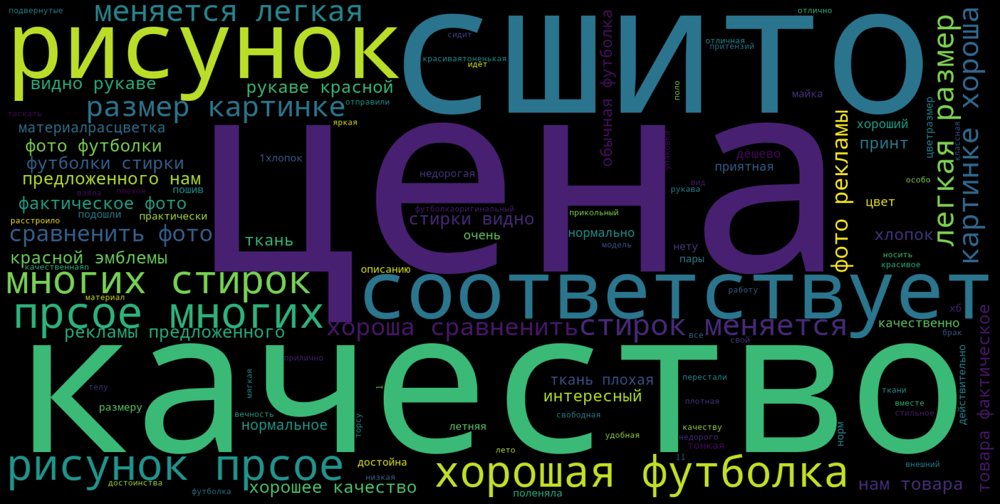

In [24]:
# "Достоинства, 2 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 2]
dost_2 = [item for item in list(frame_1['Достоинства']) if str(item) != 'nan']
dost_2

print(comment_analysis(dost_2))
word_cloud(comment_analysis(dost_2)[0])

(<Text: стирки пошел перекос ткани стоило ожидать наверное 1...>, [('качество', 55), ('стирки', 40), ('очень', 35), ('футболка', 26), ('размер', 25), ('ткань', 20), ('тонкая', 18), ('маломерит', 17), ('торчат', 17), ('нитки', 17), ('размера', 16), ('цвет', 16), ('фото', 16), ('рисунок', 16), ('это', 15), ('пришла', 15), ('заказывал', 14), ('принт', 14), ('соответствует', 12), ('маломерка', 12)])


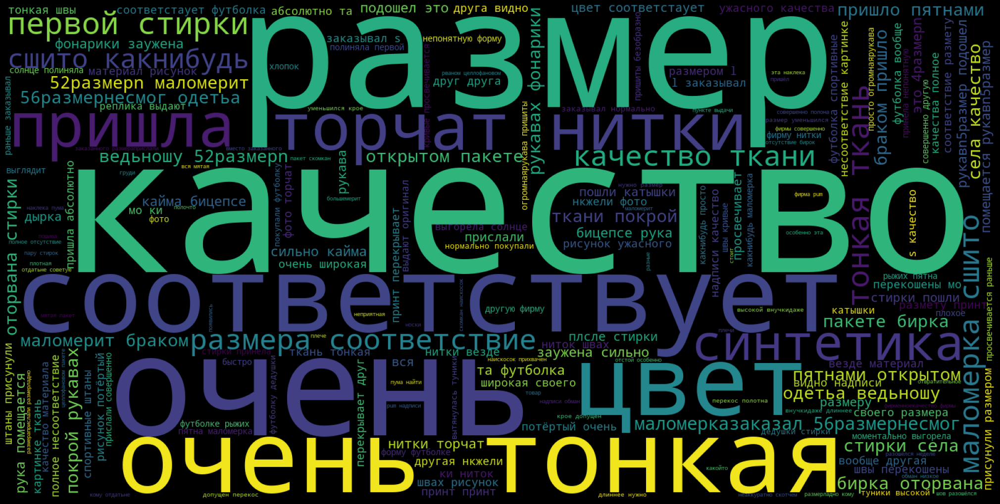

In [25]:
# "Недостатки, 2 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 2]
nedost_2 = [item for item in list(frame_1['Недостатки']) if str(item) != 'nan']
nedost_2

print(comment_analysis(nedost_2))
word_cloud(comment_analysis(nedost_2)[0])

(<Text: тонкая сойдет пятна удалось отстирать стирка рубашка села...>, [('ткань', 24), ('рекомендую', 17), ('очень', 11), ('советую', 11), ('возврат', 10), ('села', 9), ('футболка', 9), ('сто', 9), ('фото', 9), ('рубашка', 8), ('хлопок', 8), ('товар', 8), ('подумайте', 8), ('пятна', 7), ('удалось', 7), ('отстирать', 7), ('стирка', 7), ('ужас', 7), ('заказывайте', 7), ('футболки', 7)])


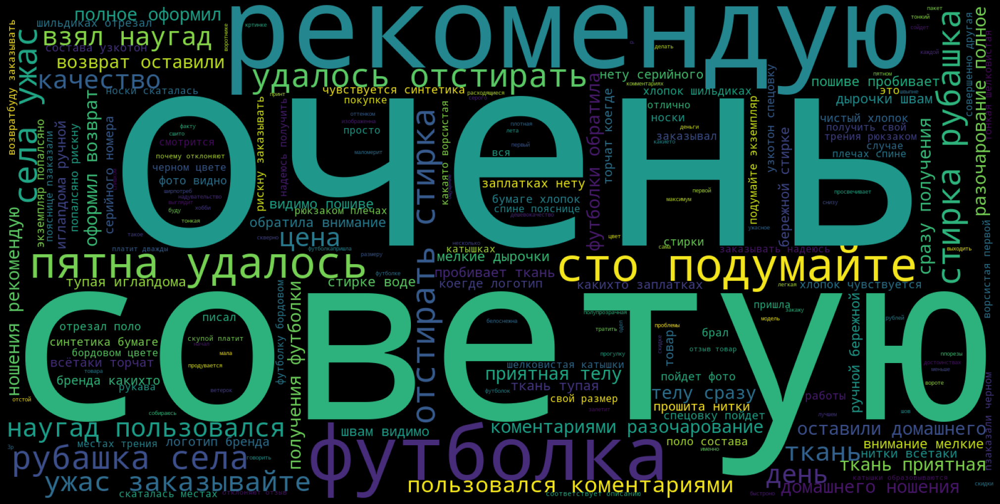

In [27]:
# "Комментарии, 2 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 2]
com_2 = [item for item in list(frame_1['Комментарий']) if str(item) != 'nan']
com_2

print(comment_analysis(com_2))
word_cloud(comment_analysis(com_2)[0])

## Результаты анализа  отзывов на 2 звезды 

### 86,56% отзывов на 2 звезды являются не пустыми 

### При указании достоинств чаще всего встречается слова -- 
[('цена', 24), ('качество', 17), ('рисунок', 13), ('футболка', 12), ('фото', 12), ('размер', 10), ('ткань', 9), ('сшито', 9), ('стирок', 8), ('товара', 8), ('стирки', 8), ('соответствует', 7), ('хорошая', 6), ('прсое', 6), ('многих', 6), ('меняется', 6), ('легкая', 6), ('картинке', 6), ('хороша', 6), ('сравненить', 6)])

### При указании недостатков чаще всего встречаются слова  
--
[('качество', 55), ('стирки', 40), ('очень', 35), ('футболка', 26), ('размер', 25), ('ткань', 20), ('тонкая', 18), ('маломерит', 17), ('торчат', 17), ('нитки', 17), ('размера', 16), ('цвет', 16), ('фото', 16), ('рисунок', 16), ('это', 15), ('пришла', 15), ('заказывал', 14), ('принт', 14), ('соответствует', 12), ('маломерка', 12)])
   
 ### При написании комментариев чаще всего встречаются слова -- 
[('ткань', 24), ('рекомендую', 17), ('очень', 11), ('советую', 11), ('возврат', 10), ('села', 9), ('футболка', 9), ('сто', 9), ('фото', 9), ('рубашка', 8), ('хлопок', 8), ('товар', 8), ('подумайте', 8), ('пятна', 7), ('удалось', 7), ('отстирать', 7), ('стирка', 7), ('ужас', 7), ('заказывайте', 7), ('футболки', 7)])


## Анализ комментариев на 3 звезды 

(<Text: качество хорошее рисунок соответствует качествоцена рекомендую любит тонкие...>, [('качество', 65), ('цена', 54), ('футболка', 50), ('материал', 35), ('размер', 30), ('ткань', 27), ('соответствует', 25), ('хлопок', 24), ('хороший', 21), ('цвет', 17), ('хорошая', 16), ('размеру', 16), ('хорошее', 14), ('майка', 14), ('нормальное', 12), ('пошив', 12), ('принт', 12), ('дома', 11), ('норм', 11), ('очень', 10)])


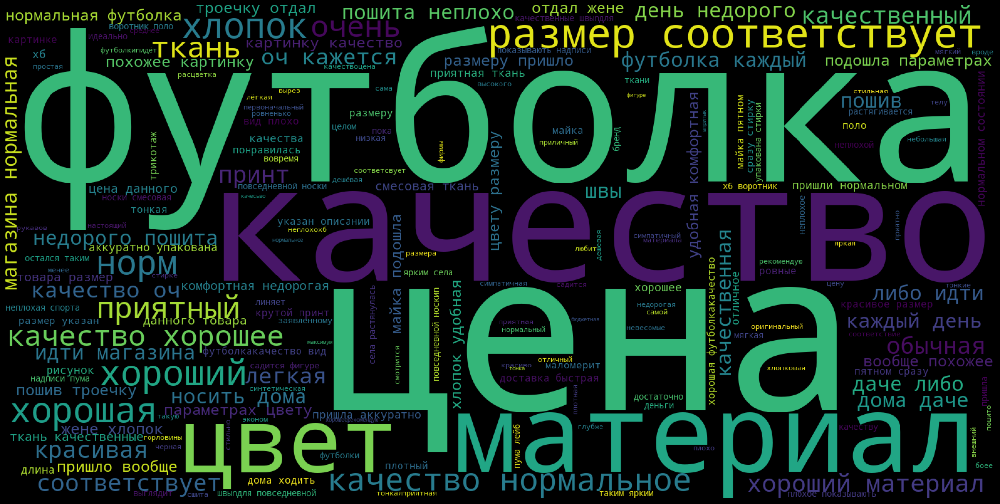

In [28]:
# "Достоинства, 3 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 3]
dost_3 = [item for item in list(frame_1['Достоинства']) if str(item) != 'nan']
dost_3

print(comment_analysis(dost_3))
word_cloud(comment_analysis(dost_3)[0])

(<Text: маломерят брать пару размеров красятся буквы рукавах быстро...>, [('стирки', 122), ('очень', 93), ('размер', 88), ('качество', 85), ('ткань', 79), ('маломерит', 73), ('соответствует', 65), ('тонкая', 65), ('цвет', 62), ('первой', 49), ('материал', 44), ('сильно', 41), ('нитки', 36), ('фото', 36), ('тонкий', 32), ('размера', 30), ('синтетика', 29), ('футболка', 25), ('футболки', 25), ('меньше', 24)])


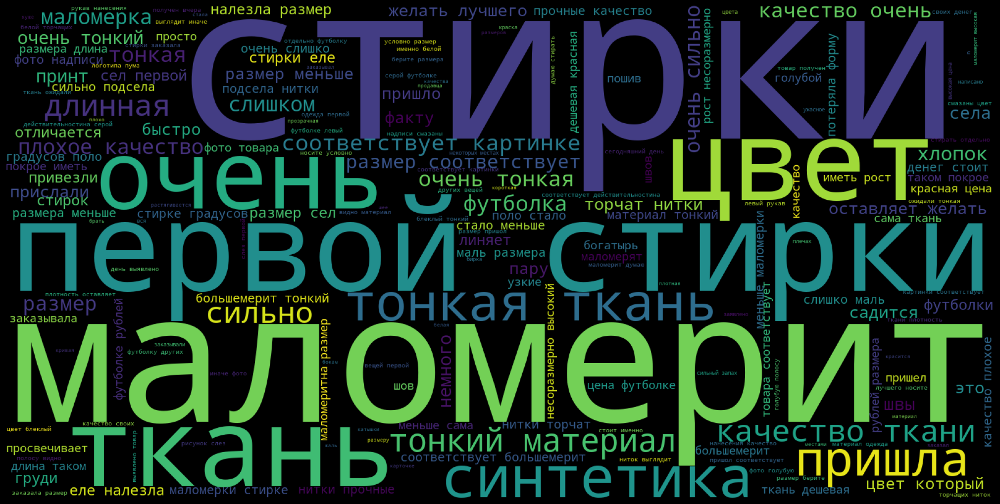

In [29]:
# "Недостатки, 3 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 3]
nedost_3 = [item for item in list(frame_1['Недостатки']) if str(item) != 'nan']
nedost_3

print(comment_analysis(nedost_3))
word_cloud(comment_analysis(nedost_3)[0])

(<Text: футболка плохая мужа размер 58заказала размер 58 стоило...>, [('размер', 59), ('футболка', 50), ('очень', 44), ('стирки', 37), ('это', 34), ('фото', 30), ('качество', 27), ('футболки', 26), ('ткань', 21), ('брать', 19), ('пришла', 19), ('села', 17), ('поло', 17), ('цвет', 15), ('52', 15), ('размеру', 14), ('хлопок', 13), ('футболку', 13), ('48', 12), ('брал', 11)])


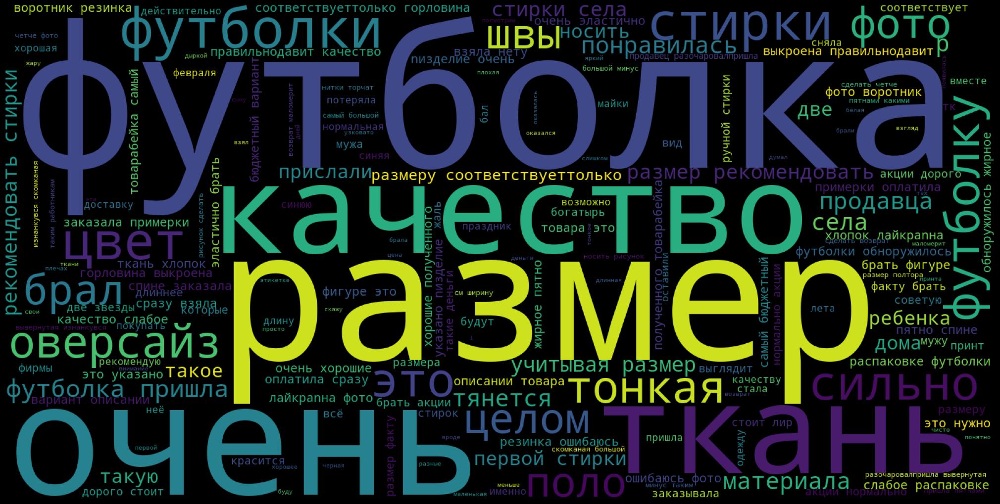

In [30]:
# "Комментарии, 3 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 3]
com_3 = [item for item in list(frame_1['Комментарий']) if str(item) != 'nan']
com_3

print(comment_analysis(com_3))
word_cloud(comment_analysis(com_3)[0])

## Результаты анализа  отзывов на 3 звезды 

### 83,5% отзывов на 3 звезды являются не пустыми 

### При указании достоинств чаще всего встречается слова -- 
[('качество', 65), ('цена', 54), ('футболка', 50), ('материал', 35), ('размер', 30), ('ткань', 27), ('соответствует', 25), ('хлопок', 24), ('хороший', 21), ('цвет', 17), ('хорошая', 16), ('размеру', 16), ('хорошее', 14), ('майка', 14), ('нормальное', 12), ('пошив', 12), ('принт', 12), ('дома', 11), ('норм', 11), ('очень', 10)])

### При указании недостатков чаще всего встречаются слова  
--
[('качество', 55), ('стирки', 40), ('очень', 35), ('футболка', 26), ('размер', 25), ('ткань', 20), ('тонкая', 18), ('маломерит', 17), ('торчат', 17), ('нитки', 17), ('размера', 16), ('цвет', 16), ('фото', 16), ('рисунок', 16), ('это', 15), ('пришла', 15), ('заказывал', 14), ('принт', 14), ('соответствует', 12), ('маломерка', 12)])
   
 ### При написании комментариев чаще всего встречаются слова -- 
[('размер', 59), ('футболка', 50), ('очень', 44), ('стирки', 37), ('это', 34), ('фото', 30), ('качество', 27), ('футболки', 26), ('ткань', 21), ('брать', 19), ('пришла', 19), ('села', 17), ('поло', 17), ('цвет', 15), ('52', 15), ('размеру', 14), ('хлопок', 13), ('футболку', 13), ('48', 12), ('брал', 11)])

## Анализ комментариев на 4 звезды 

(<Text: тонкая лета качество кроя хорошее качество приятный трикотаж...>, [('качество', 233), ('цена', 127), ('футболка', 112), ('хорошая', 105), ('хорошее', 78), ('ткань', 76), ('размер', 60), ('материал', 57), ('соответствует', 46), ('приятная', 46), ('хлопок', 45), ('хороший', 45), ('цвет', 39), ('норм', 34), ('хб', 31), ('приятный', 29), ('принт', 28), ('красивая', 27), ('швы', 26), ('качественный', 22)])


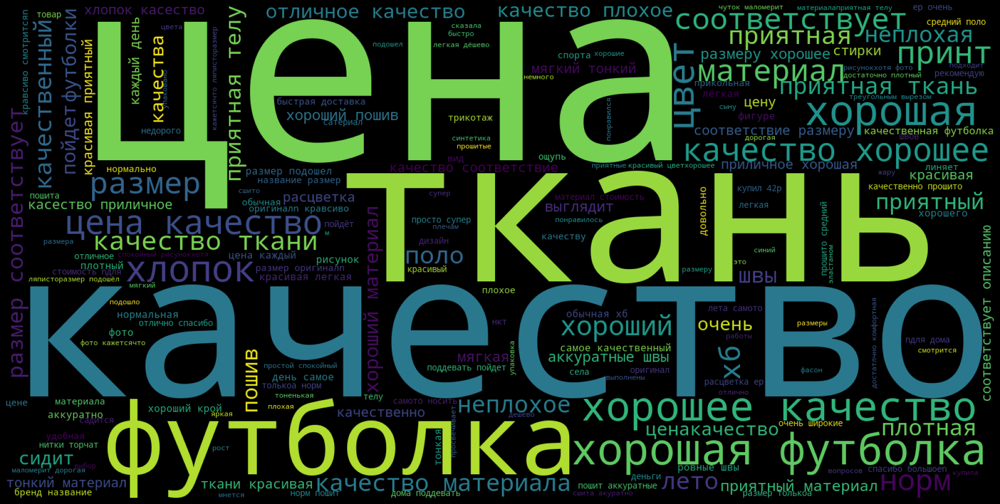

In [31]:
# "Достоинства, 4 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 4]
dost_4 = [item for item in list(frame_1['Достоинства']) if str(item) != 'nan']
dost_4

print(comment_analysis(dost_4))
word_cloud(comment_analysis(dost_4)[0])

(<Text: хб 1 хлопок похоже маломерит крупный брал 66...>, [('маломерит', 92), ('размер', 90), ('очень', 89), ('стирки', 79), ('ткань', 69), ('цвет', 54), ('тонкая', 46), ('качество', 44), ('материал', 44), ('немного', 41), ('фото', 41), ('футболка', 40), ('тонкий', 38), ('сильно', 36), ('просвечивает', 32), ('соответствует', 30), ('1', 28), ('прислали', 26), ('длинная', 25), ('синтетика', 23)])


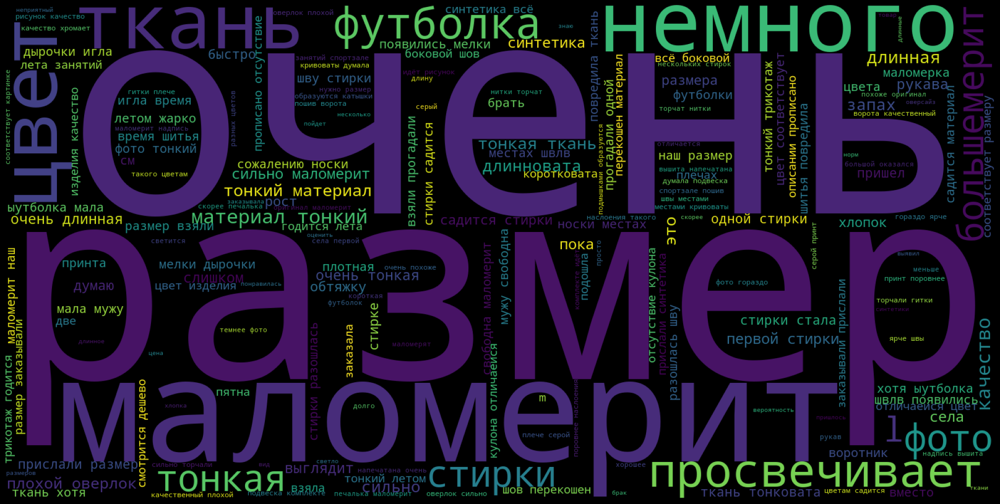

In [32]:
# "Недостатки, 4 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 4]
nedost_4 = [item for item in list(frame_1['Недостатки']) if str(item) != 'nan']
nedost_4

print(comment_analysis(nedost_4))
word_cloud(comment_analysis(nedost_4)[0])

(<Text: выбрали другую соответствует своей цене тяжело определиться размером...>, [('футболка', 95), ('размер', 71), ('очень', 58), ('качество', 37), ('рекомендую', 33), ('маломерит', 30), ('цена', 28), ('соответствует', 26), ('цену', 25), ('хорошая', 24), ('целом', 23), ('длина', 23), ('стирки', 23), ('ткань', 22), ('нормально', 20), ('футболки', 20), ('размера', 19), ('цвет', 19), ('материал', 19), ('пойдет', 19)])


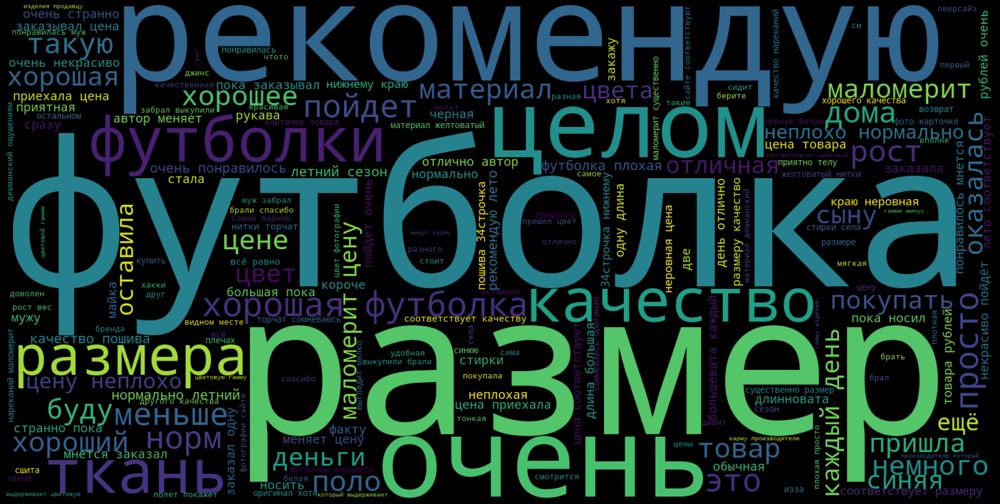

In [33]:
# "Комментарии, 4 звезды" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 4]
com_4 = [item for item in list(frame_1['Комментарий']) if str(item) != 'nan']
com_4

print(comment_analysis(com_4))
word_cloud(comment_analysis(com_4)[0])

## Результаты анализа  отзывов на 4 звезды 

### 52,72% отзывов на 4 звезды являются не пустыми 

### При указании достоинств чаще всего встречается слова -- 
[('качество', 233), ('цена', 127), ('футболка', 112), ('хорошая', 105), ('хорошее', 78), ('ткань', 76), ('размер', 60), ('материал', 57), ('соответствует', 46), ('приятная', 46), ('хлопок', 45), ('хороший', 45), ('цвет', 39), ('норм', 34), ('хб', 31), ('приятный', 29), ('принт', 28), ('красивая', 27), ('швы', 26), ('качественный', 22)])

### При указании недостатков чаще всего встречаются слова  
--
[('маломерит', 92), ('размер', 90), ('очень', 89), ('стирки', 79), ('ткань', 69), ('цвет', 54), ('тонкая', 46), ('качество', 44), ('материал', 44), ('немного', 41), ('фото', 41), ('футболка', 40), ('тонкий', 38), ('сильно', 36), ('просвечивает', 32), ('соответствует', 30), ('1', 28), ('прислали', 26), ('длинная', 25), ('синтетика', 23)])
   
 ### При написании комментариев чаще всего встречаются слова -- 
[('футболка', 95), ('размер', 71), ('очень', 58), ('качество', 37), ('рекомендую', 33), ('маломерит', 30), ('цена', 28), ('соответствует', 26), ('цену', 25), ('хорошая', 24), ('целом', 23), ('длина', 23), ('стирки', 23), ('ткань', 22), ('нормально', 20), ('футболки', 20), ('размера', 19), ('цвет', 19), ('материал', 19), ('пойдет', 19)])

## Анализ комментариев на 5 звезд

(<Text: приятная ткань нежный цвет аккуратно пошито поло нитки...>, [('качество', 3813), ('футболка', 1738), ('хорошее', 1344), ('размер', 1010), ('цена', 944), ('хорошая', 924), ('ткань', 818), ('очень', 749), ('отличное', 701), ('приятная', 666), ('материал', 623), ('соответствует', 584), ('отличная', 548), ('цвет', 536), ('хлопок', 438), ('телу', 426), ('супер', 426), ('хороший', 425), ('качества', 340), ('отлично', 311)])


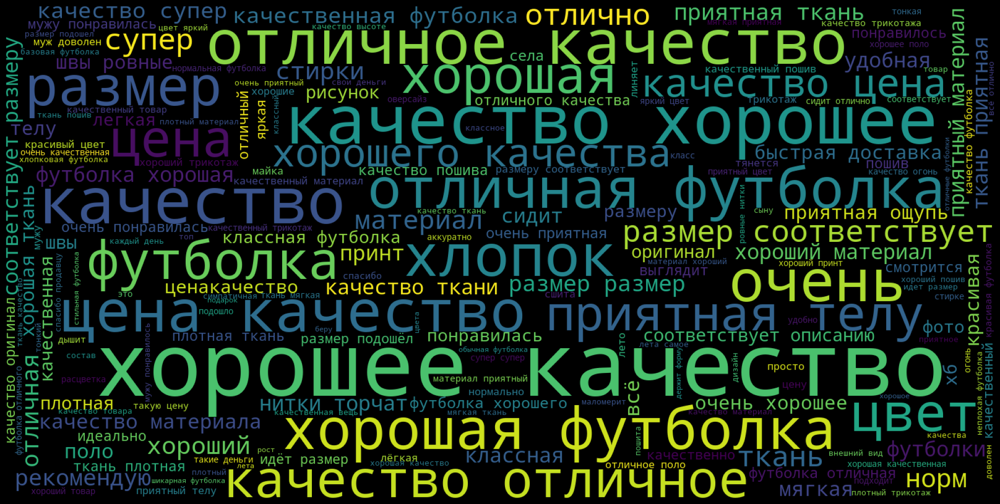

In [34]:
# "Достоинства, 5 звезд" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 5]
dost_5 = [item for item in list(frame_1['Достоинства']) if str(item) != 'nan']
dost_5

print(comment_analysis(dost_5))
word_cloud(comment_analysis(dost_5)[0])

(<Text: выявлены маломерит маленькая затяжка около воротника видимо ктото...>, [('пока', 290), ('нету', 186), ('маломерит', 164), ('немного', 139), ('размер', 125), ('выявлено', 100), ('обнаружено', 92), ('обнаружил', 90), ('стирки', 75), ('очень', 66), ('цвет', 62), ('большемерит', 57), ('выявил', 54), ('длинная', 48), ('это', 44), ('нитки', 43), ('обнаружила', 43), ('нашла', 40), ('нашёл', 31), ('футболка', 29)])


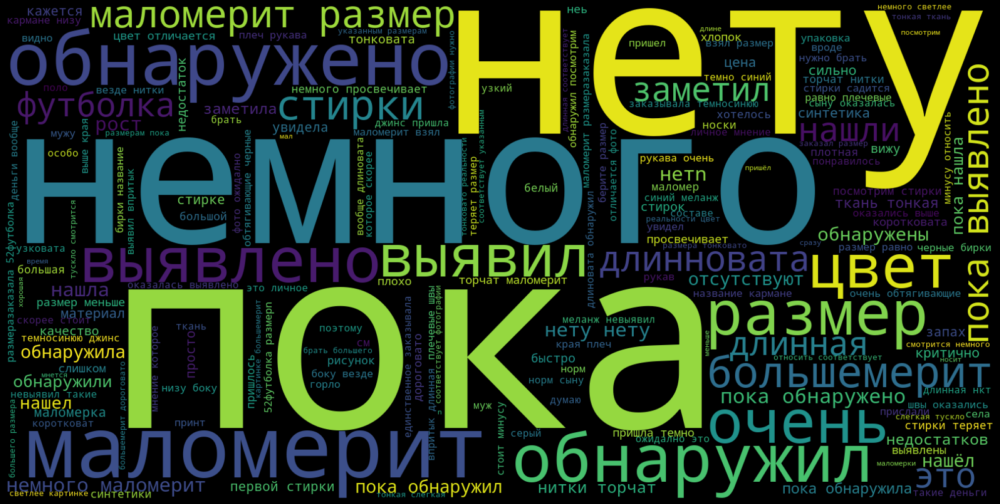

In [35]:
# "Недостатки, 5 звезд" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 5]
nedost_5 = [item for item in list(frame_1['Недостатки']) if str(item) != 'nan']
nedost_5

print(comment_analysis(nedost_5))
word_cloud(comment_analysis(nedost_5)[0])

(<Text: красивый дизайн пуговицы застёгивании торчат закрыты тканью подойдет...>, [('рекомендую', 1198), ('футболка', 1177), ('размер', 1014), ('качество', 713), ('очень', 655), ('хорошая', 404), ('спасибо', 385), ('соответствует', 382), ('понравилась', 367), ('мужу', 349), ('покупке', 341), ('отличная', 326), ('стирки', 317), ('ткань', 292), ('хорошее', 290), ('цвет', 283), ('советую', 273), ('отлично', 271), ('приятная', 244), ('поло', 209)])


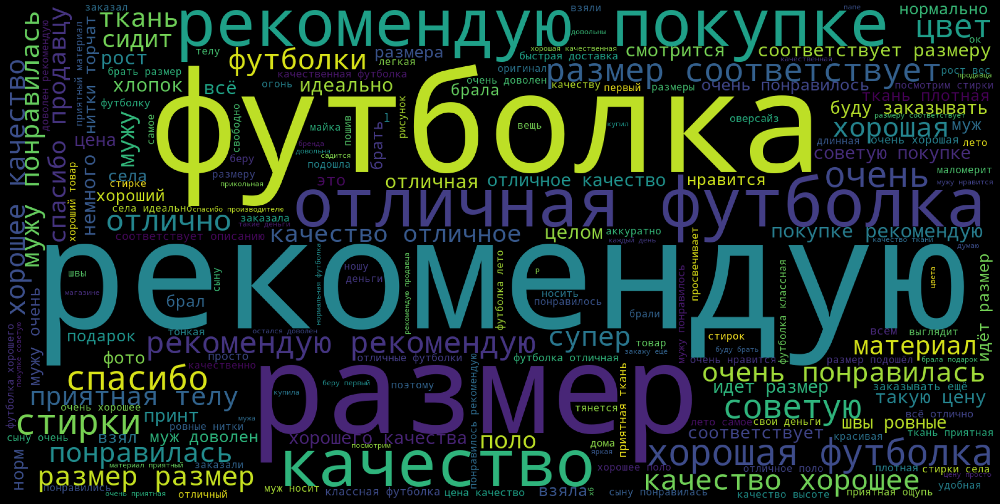

In [36]:
# "Комментарии, 5 звезд" 
frame_1 = df_out_of_NaN[df_out_of_NaN.Звезды == 5]
com_5 = [item for item in list(frame_1['Комментарий']) if str(item) != 'nan']
com_5

print(comment_analysis(com_5))
word_cloud(comment_analysis(com_5)[0])

## Результаты анализа  отзывов на 5 звезд 

### 48,79% отзывов на 5 звезды являются не пустыми 

### При указании достоинств чаще всего встречается слова -- 
[('качество', 3813), ('футболка', 1738), ('хорошее', 1344), ('размер', 1010), ('цена', 944), ('хорошая', 924), ('ткань', 818), ('очень', 749), ('отличное', 701), ('приятная', 666), ('материал', 623), ('соответствует', 584), ('отличная', 548), ('цвет', 536), ('хлопок', 438), ('телу', 426), ('супер', 426), ('хороший', 425), ('качества', 340), ('отлично', 311)])

### При указании недостатков чаще всего встречаются слова  
--
[('пока', 290), ('нету', 186), ('маломерит', 164), ('немного', 139), ('размер', 125), ('выявлено', 100), ('обнаружено', 92), ('обнаружил', 90), ('стирки', 75), ('очень', 66), ('цвет', 62), ('большемерит', 57), ('выявил', 54), ('длинная', 48), ('это', 44), ('нитки', 43), ('обнаружила', 43), ('нашла', 40), ('нашёл', 31), ('футболка', 29)])
   
 ### При написании комментариев чаще всего встречаются слова -- 
[('рекомендую', 1198), ('футболка', 1177), ('размер', 1014), ('качество', 713), ('очень', 655), ('хорошая', 404), ('спасибо', 385), ('соответствует', 382), ('понравилась', 367), ('мужу', 349), ('покупке', 341), ('отличная', 326), ('стирки', 317), ('ткань', 292), ('хорошее', 290), ('цвет', 283), ('советую', 273), ('отлично', 271), ('приятная', 244), ('поло', 209)])